<a href="https://colab.research.google.com/github/Parv-Agarwal/Internship-project/blob/main/Joint_Embedding_Loss.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
import os
import numpy as np
from PIL import Image


In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
nz = 100
ngf = 64
nc = 3
num_classes = 10

In [8]:
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # Input is Z + one-hot class vector
            nn.ConvTranspose2d(nz + 10, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # State size: (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # State size: (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # State size: (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # Output size: (nc) x 32 x 32
        )

    def forward(self, input):
        return self.main(input)

In [9]:
class FeatureExtractor(nn.Module):
    def __init__(self):
        super(FeatureExtractor, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 32, 5),
            nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(32, 48, 5),
            nn.ReLU(True),
            nn.MaxPool2d(2, 2)
        )
        self.conv_to_single_channel = nn.Conv2d(48, 1, kernel_size=1)  # Reduce channels to 1
        self.adaptive_pool = nn.AdaptiveAvgPool2d((28, 28))

    def forward(self, x):
        x = self.conv(x)                        # Shape: (batch_size, 48, H, W)
        x = self.conv_to_single_channel(x)      # Shape: (batch_size, 1, H, W)
        x = self.adaptive_pool(x)               # Shape: (batch_size, 1, 28, 28)
        x = x.view(x.size(0), -1)               # Flatten -> Shape: (batch_size, 28 * 28)
        return x


In [10]:
netG = Generator(nz, ngf, nc).to(device)
netF = FeatureExtractor().to(device)
netG.load_state_dict(torch.load('pre_trained_gan_weights_mnist.pth'))
netF.load_state_dict(torch.load('pre_trained_feature_extractor_weights.pth'))
for param in netF.parameters():
    param.requires_grad = False

netG.train()  # Set generator to training mode
netF.eval()

<ipython-input-10-e4e7ef5d5aa6>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netG.load_state_dict(torch.load('pre_trained_gan_weights_mnist.pth'))
<ipython-input-10-e4e7

FeatureExtractor(
  (conv): Sequential(
    (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 48, kernel_size=(5, 5), stride=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_to_single_channel): Conv2d(48, 1, kernel_size=(1, 1), stride=(1, 1))
  (adaptive_pool): AdaptiveAvgPool2d(output_size=(28, 28))
)

In [11]:
import matplotlib.pyplot as plt
def test_label(netG, class_label):
  netG.eval()

  # Define the label for which you want to generate MNIST-M images (e.g., 5)
  test_label = class_label
  num_samples = 10  # Number of images to generate

  # Generate random noise
  noise = torch.randn(num_samples, nz, 1, 1, device=device)

  # Create one-hot encoding of the test label
  test_label_tensor = torch.tensor([test_label] * num_samples, device=device)
  test_label_one_hot = torch.nn.functional.one_hot(test_label_tensor, num_classes).type(torch.float).to(device)
  test_label_one_hot_gen = test_label_one_hot.unsqueeze(2).unsqueeze(3)

  # Concatenate the noise and the label
  noise_with_labels = torch.cat((noise, test_label_one_hot_gen), 1)

  # Generate fake MNIST-M images
  with torch.no_grad():  # No need to track gradients during inference
      fake_images = netG(noise_with_labels).cpu()

  # Display generated images
  fig, axes = plt.subplots(1, num_samples, figsize=(num_samples, 2))
  for i in range(num_samples):
      # Assuming MNIST-M images are RGB, we use transpose to convert the generated tensor to (H, W, C)
      axes[i].imshow(fake_images[i].permute(1, 2, 0))  # permute to (height, width, channels) for RGB
      axes[i].axis('off')

  plt.show()

In [12]:
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [13]:
transform_mnist = transforms.Compose([
    transforms.Resize(32),
    transforms.Grayscale(num_output_channels=3),  # Converts grayscale to 3 channels
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Adjusted for 3 channels
])
full_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform_mnist)


Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 9.91M/9.91M [00:00<00:00, 16.4MB/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 28.9k/28.9k [00:00<00:00, 490kB/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 1.65M/1.65M [00:00<00:00, 4.50MB/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 4.54k/4.54k [00:00<00:00, 3.82MB/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [14]:
# Create indices for label 5 and labels not equal to 5
indices_e5 = [i for i, target in enumerate(full_dataset.targets) if target == 5]
indices_eg = [i for i, target in enumerate(full_dataset.targets) if target != 5]

In [15]:
from torch.utils.data import Subset

dataset_e5 = Subset(full_dataset, indices_e5)
dataset_eg = Subset(full_dataset, indices_eg)

# Create DataLoaders
batch_size = 64

loader_e5 = torch.utils.data.DataLoader(dataset_e5, batch_size=batch_size, shuffle=True)
loader_eg = torch.utils.data.DataLoader(dataset_eg, batch_size=batch_size, shuffle=True)


In [16]:
def create_one_hot_labels(labels, num_classes=10):
    one_hot = torch.zeros(labels.size(0), num_classes, device=labels.device)
    one_hot.scatter_(1, labels.unsqueeze(1), 1)
    return one_hot

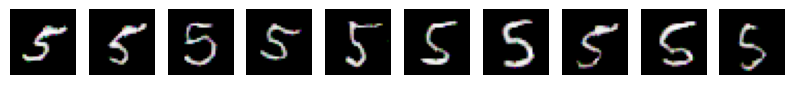

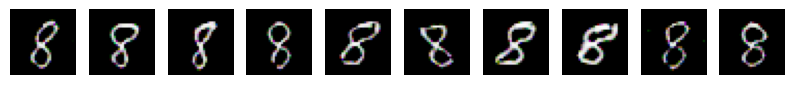

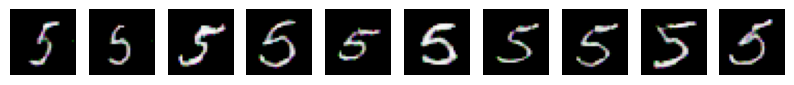

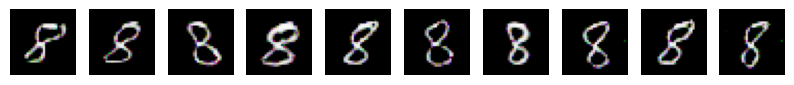

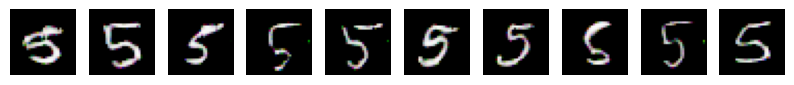

...

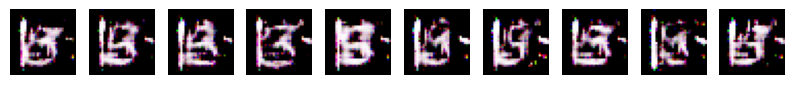

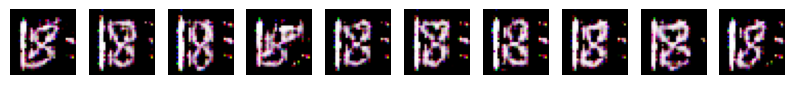

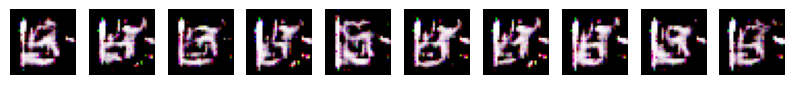

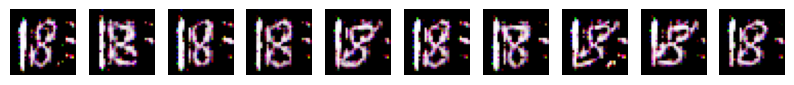

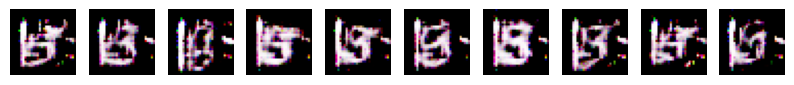

In [ ]:
num_epochs = 10
for epoch in range(num_epochs):
    # Iterate over the loaders
    for (data_e5, labels_e5), (data_eg, labels_eg) in zip(loader_e5, loader_eg):
        data_e5 = data_e5.to(device)  # Shape: (batch_size, 3, 32, 32)
        data_eg = data_eg.to(device)
        labels_e5 = labels_e5.to(device)
        labels_eg = labels_eg.to(device)

        batch_size_e5 = data_e5.size(0)
        batch_size_eg = data_eg.size(0)
        batch_size_min = min(batch_size_e5, batch_size_eg)
        batch_size = batch_size_min

        # Adjust batch sizes if necessary
        data_e5 = data_e5[:batch_size]
        data_eg = data_eg[:batch_size]
        labels_e5 = labels_e5[:batch_size]
        labels_eg = labels_eg[:batch_size]

        # Generate images with label 5 using the generator
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        label = torch.full((batch_size,), 5, dtype=torch.long, device=device)
        one_hot_labels = create_one_hot_labels(label).unsqueeze(2).unsqueeze(3)  # Shape: (batch_size, 10, 1, 1)
        gen_input = torch.cat((noise, one_hot_labels), dim=1)

        gen_images = netG(gen_input)  # Generated images, Shape: (batch_size, 3, 32, 32)

        # Get features from generated images
        f_ip = netF(gen_images)  # Shape: (batch_size, feature_dim)

        # Get features from images with label 5
        f_i5 = netF(data_e5)

        # Get features from images with labels not equal to 5
        f_jg = netF(data_eg)

        # Compute dot products
        # The dot products are computed row-wise
        # We need to compute (f_ip ⋅ f_jg) and (f_ip ⋅ f_i5)
        # Since f_ip, f_i5, f_jg are of shape (batch_size, feature_dim)
        # We can compute the pairwise dot products using torch.bmm

        # Expand dimensions for batch matrix multiplication
        f_ip_exp = f_ip.unsqueeze(1)  # Shape: (batch_size, 1, feature_dim)
        f_i5_exp = f_i5.unsqueeze(2)  # Shape: (batch_size, feature_dim, 1)
        f_jg_exp = f_jg.unsqueeze(2)  # Shape: (batch_size, feature_dim, 1)

        # Compute dot products
        dot_products_fip_fi5 = torch.bmm(f_ip_exp, f_i5_exp).squeeze()  # Shape: (batch_size,)
        dot_products_fip_fjg = torch.bmm(f_ip_exp, f_jg_exp).squeeze()  # Shape: (batch_size,)

        # Compute margin
        margin = dot_products_fip_fi5 - dot_products_fip_fjg + 1  # Shape: (batch_size,)

        # Apply ReLU to compute max(0, margin)
        loss_vector = torch.relu(margin)

        # Sum over the batch
        loss = torch.sum(loss_vector)

        # Backpropagation
        optimizerG.zero_grad()
        loss.backward()
        optimizerG.step()
        test_label(netG, 5)
        test_label(netG, 8)
        netG.train()

    #print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}")